# How to Renovate Your Room

- https://medium.com/@melgor89/generative-interior-design-challenge-2024-2nd-place-solution-6338f19f6fe3

In [1]:
from importlib.metadata import version
import cv2
import torch
import numpy as np
from PIL import Image
import torch
import time
import matplotlib.pyplot as plt
import textwrap


props = torch.cuda.get_device_properties(0)
gpu_info = f"{torch.cuda.get_device_name(0)} ({props.total_memory/1024**3:.1f} GB)"

requirements_by_category = {
    "##### GPU #####": [
        f"GPU count: {torch.cuda.device_count()}",
        f"GPU 0: {gpu_info}",
        f"CUDA version: {torch.version.cuda}",
    ],
    "##### Diffusion & AI #####": [
        f"diffusers=={version('diffusers')}",
        f"transformers=={version('transformers')}",
        f"accelerate=={version('accelerate')}",
        f"safetensors=={version('safetensors')}",
        f"torch=={version('torch')}",
        f"xformers=={version('xformers')}",
    ],
    "##### Image Processing #####": [
        f"numpy=={version('numpy')}",
        f"opencv-python-headless=={version('opencv-python-headless')}",
        f"Pillow=={version('Pillow')}",
    ]
}

for category, reqs in requirements_by_category.items():
    print(category)
    for req in sorted(reqs, key=str.lower):
        print(req)
    print()

##### GPU #####
CUDA version: 12.1
GPU 0: NVIDIA Graphics Device (47.5 GB)
GPU count: 4

##### Diffusion & AI #####
accelerate==1.9.0
diffusers==0.35.0.dev0
safetensors==0.6.1
torch==2.5.1+cu121
transformers==4.55.0
xformers==0.0.29.post1

##### Image Processing #####
numpy==2.1.2
opencv-python-headless==4.10.0.84
Pillow==9.4.0



In [2]:
def display_images(images: list, titles: list = None, grid: tuple = (1, None), figsize: tuple = (15, 5), show_axes: bool = True):
    """Отображает изображения с авто-генерацией технических заголовков."""
    if not images: return

    if titles is None:
        titles = []
        for i, img in enumerate(images):
            # Проверяем тип объекта: NumPy array или PIL Image
            if isinstance(img, np.ndarray):
                mode = 'N/A'
                if len(img.shape) == 2: mode = "L"
                elif img.shape[2] == 3: mode = 'RGB'
                elif img.shape[2] == 4: mode = 'RGBA'
                titles.append(f"img{i}, {img.shape}, {mode}")
            # Для PIL и подобных объектов с атрибутами size, mode
            elif hasattr(img, 'size'):
                titles.append(f"img{i}, {img.size}, {img.mode}, {getattr(img, 'format', None)}")
            else:
                titles.append(f"img{i}")

    num_images = len(images)
    rows, cols = grid
    if cols is None:
        cols = (num_images + rows - 1) // rows

    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.ravel(axes)

    for i, ax in enumerate(axes):
        if i < num_images:
            ax.imshow(images[i])
            if titles: ax.set_title(titles[i])
            if not show_axes: ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Step 1: txt2img

**Задача:** клиент хочет быстро представить, как может выглядеть его будущий ремонт → даём текстовый запрос и получаем визуализацию.

In [3]:
# Easy: базовый стиль, минимум деталей
easy_prompt = (
    "Scandinavian living room with a blue velvet sofa, "
    "large windows letting in sunlight, polished wood floor, white walls, airy atmosphere."
)

# Medium: та же сцена, добавляем расположение и новые объекты
medium_prompt = (
    "Scandinavian living room with a blue velvet sofa against the left wall, "
    "large panoramic windows on the right letting in sunlight, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows, "
    "polished wood floor and white walls, airy atmosphere."
)

# Hard: усложняем ещё — добавляем размеры, освещение, камеру
hard_prompt = (
    "20 m² Scandinavian living room with 2.4 m ceiling, "
    "blue velvet sofa against the left wall, large panoramic windows on the right, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows, "
    "polished wood floor and white walls, airy atmosphere, "
    "photorealistic, 24mm lens, f/8, bright midday sunlight."
)

## [runwayml/stable-diffusion-v1-5](https://huggingface.co/stable-diffusion-v1-5/stable-diffusion-v1-5) [Oct 2022]

**Зачем смотрим:** базовый классический генератор, быстрый старт, минимум входных данных.

**Pros:**  
- Простые запросы → быстрый результат  
- Легко развернуть, мало настроек  
- Хорошо накидывать идеи по стилям  

**Cons:**  
- Фантазирует, нет реализма  
- Слабые детали и геометрия  
- Плохо управляется сложными промптами

**Specs**  
- `height`, `width`: 512 × 512 (родное разрешение)  
- `num_inference_steps`: 20–50 (обычно 30 достаточно)  
- `guidance_scale`: 7.0–8.5 (часто ≈ 7.5)  
- Требования: ~10 GB VRAM для генерации в fp16

In [42]:
model_name = "runwayml/stable-diffusion-v1-5"
device = 'cuda:2'
torch_dtype = torch.float16
seed = 5

params = {
    'height': 512,
    'width': 512,
    'num_inference_steps': 50,
    'guidance_scale': 7.5
}

In [7]:
from diffusers import StableDiffusionPipeline

torch.cuda.reset_peak_memory_stats(device)
pipe = StableDiffusionPipeline.from_pretrained(model_name, torch_dtype=torch_dtype).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Peak after load: 5.16 GB


### Easy Prompt

In [46]:
torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(prompt=easy_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/50 [00:00<?, ?it/s]

Generation time: 1.97s
Peak GPU memory consumption: 0.00Gb


Scandinavian living room with a blue velvet sofa, large windows
letting in sunlight, polished wood floor, white walls, airy
atmosphere.


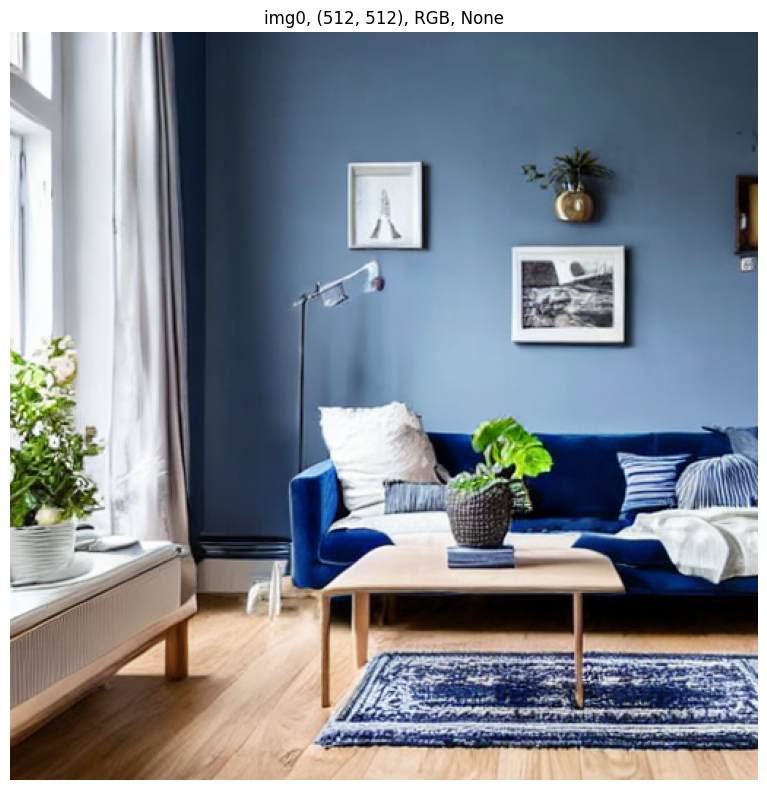

In [47]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Синий диван есть, стиль скандинавский угадывается  
- ✅ Большие окна, светлая атмосфера  
- ❌ Появились лишние предметы (ковёр, тумбочка)  
- ❌ Размытые границы, кривые текстуры (галлюцинации)  
- ❌ Детализация слабая

### Medium Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

Scandinavian living room with a blue velvet sofa against the left
wall, large panoramic windows on the right letting in sunlight, a
modern floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere.


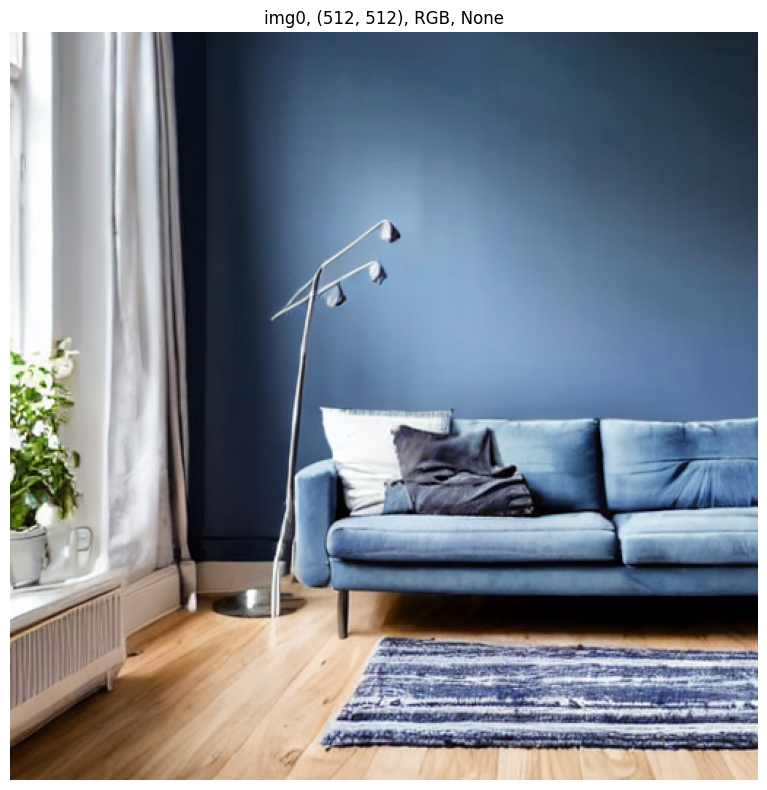

In [48]:
pipe_result_medium = pipe(prompt=medium_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Синий диван сохранился  
- ✅ Окна и солнечный свет есть  
- ❌ Велосипед из промпта потерян  
- ❌ Окна не панорамные, геометрия не соответствует описанию  
- ❌ Мебель и лампа упрощены, видны артефакты  

### Hard Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

20 m² Scandinavian living room with 2.4 m ceiling, blue velvet sofa
against the left wall, large panoramic windows on the right, a modern
floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere,
photorealistic, 24mm lens, f/8, bright midday sunlight.


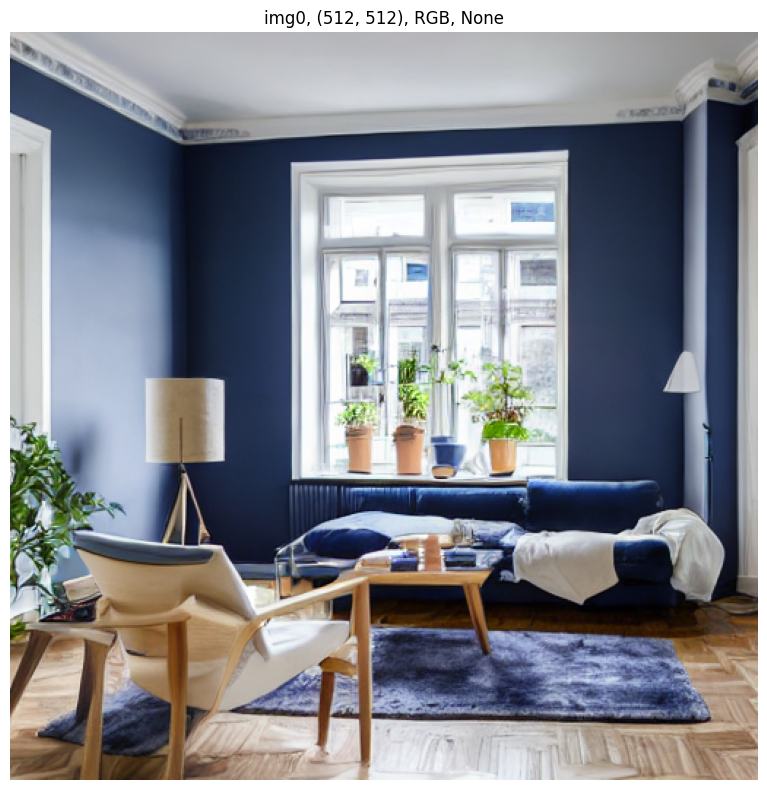

In [49]:
pipe_result_hard = pipe(prompt=hard_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Сохранились ключевые объекты: диван, лампа, окна  
- ✅ Добавились признаки «фото» (свет, объектив)  
- ❌ Велосипед снова отсутствует  
- ❌ Размеры и «20 м², 2.4 м потолок» никак не отразились  
- ❌ Много визуальных артефактов: размазанные текстуры, некорректные тени  
- ❌ Контроль над расположением слабый

### Comparing

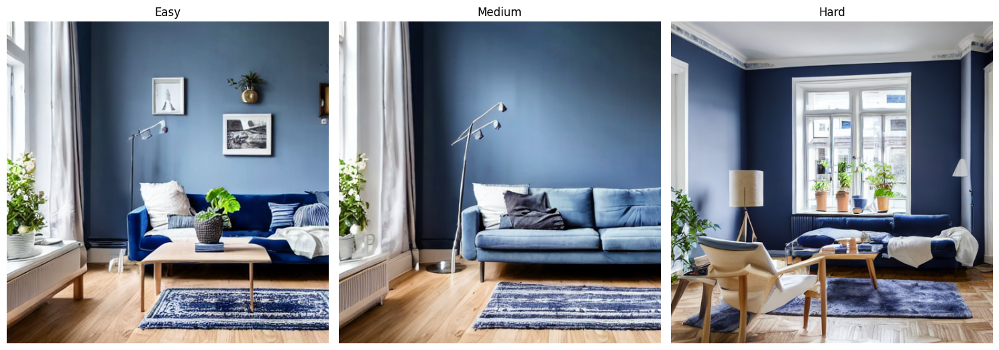

In [50]:
display_images(
    images=[pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(15, 12)
)

## [stabilityai/stable-diffusion-xl-base-1.0](https://huggingface.co/stabilityai/stable-diffusion-xl-base-1.0) [Jul 2023]

**Зачем смотрим:** более современная модель, лучше справляется с деталями, реализмом и сложными промптами, подходит для задач визуализации ближе к реальному интерьеру.  

**Pros:**  
- Реалистичнее и детальнее, чем SD1.5  
- Хорошо удерживает сложные промпты и композицию  
- Базовое разрешение 1024×1024 → больше деталей без апскейла  
- Поддерживает работу в связке с `refiner` для улучшения качества  

**Cons:**  
- Тяжелее и медленнее, требует больше VRAM (≈ 16 GB и выше для fp16)  
- Всё ещё может «фантазировать» и искажать геометрию  
- Контроль лучше, чем у SD1.5, но до архитектурной точности далеко  

**Specs:**  

- ~16 GB VRAM для генерации в fp16 (1024×1024)  

In [3]:
model_name = "stabilityai/stable-diffusion-xl-base-1.0"
device = 'cuda:2'
torch_dtype = torch.float16
seed = 5

params = {
    'height': 1024,
    'width': 1024,
    'num_inference_steps': 50,
    'guidance_scale': 7.5
}

In [4]:
from diffusers import StableDiffusionXLPipeline

torch.cuda.reset_peak_memory_stats(device)
pipe = StableDiffusionXLPipeline.from_pretrained(model_name, torch_dtype=torch_dtype).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Peak after load: 6.57 GB


### Easy Prompt

In [13]:
torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(prompt=easy_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/50 [00:00<?, ?it/s]

Generation time: 9.33s
Peak GPU memory consumption: 10.71Gb


Scandinavian living room with a blue velvet sofa, large windows
letting in sunlight, polished wood floor, white walls, airy
atmosphere.


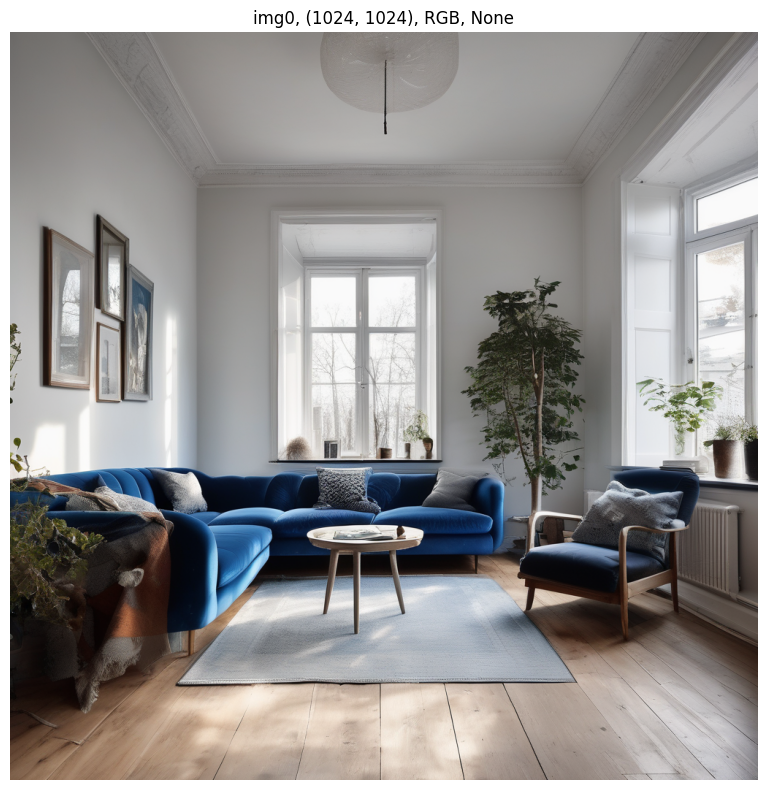

In [8]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Синий диван и скандинавский стиль воспроизведены чётко  
- ✅ Реалистичное освещение, ровные текстуры  
- ✅ Атмосфера просторной светлой комнаты сохранена  
- ❌ Есть лёгкие «фантазии» в декоре, которых не было в промпте  

### Medium Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

Scandinavian living room with a blue velvet sofa against the left
wall, large panoramic windows on the right letting in sunlight, a
modern floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere.


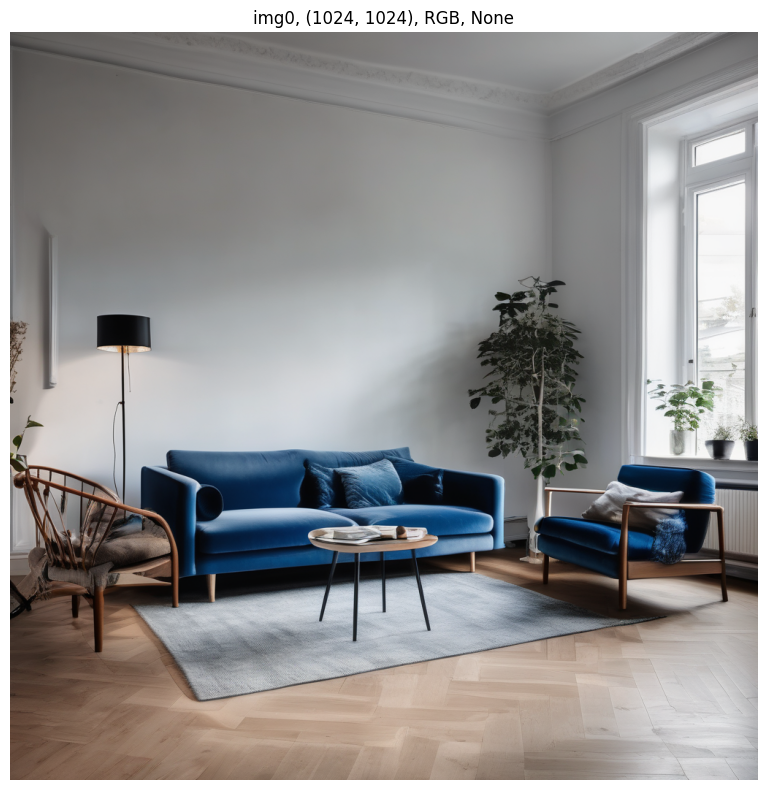

In [9]:
pipe_result_medium = pipe(prompt=medium_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Диван и окна на месте, добавлен торшер → промпт частично соблюдён  
- ✅ Качество деталей хорошее 
- ❌ Велосипед снова отсутствует  
- ❌ Расположение объектов интерпретируется вольно, не всегда как в тексте  

### Hard Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

20 m² Scandinavian living room with 2.4 m ceiling, blue velvet sofa
against the left wall, large panoramic windows on the right, a modern
floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere,
photorealistic, 24mm lens, f/8, bright midday sunlight.


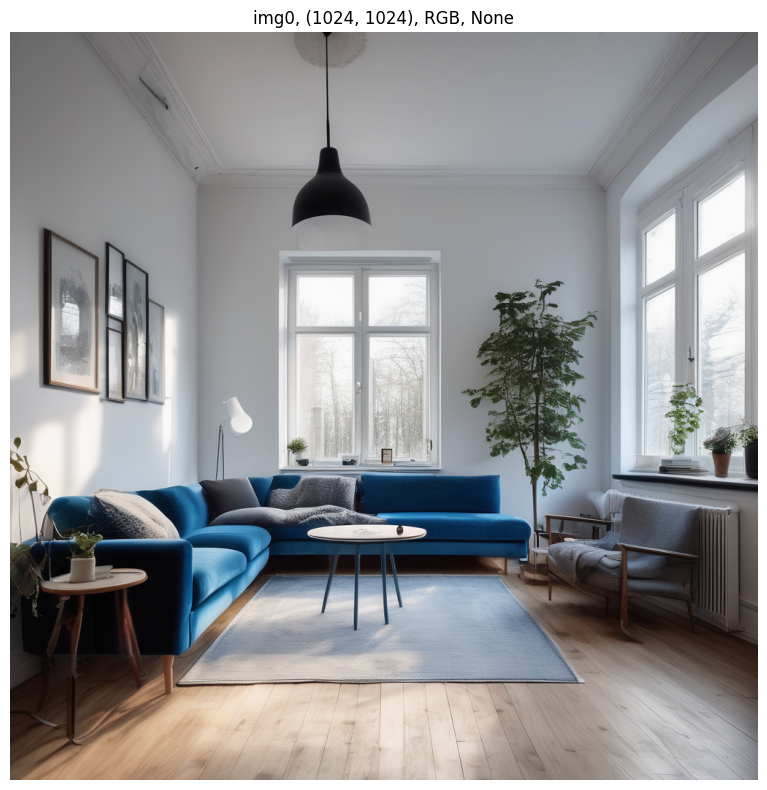

In [10]:
pipe_result_hard = pipe(prompt=hard_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Хорошо проработаны материалы, свет и тени  
- ✅ Камера/объектив отразились в композиции (реалистичная перспектива)  
- ❌ Цифровые параметры (20 м², 2.4 м потолок) модель проигнорировала  
- ❌ Велосипед отсутствует, часть объектов из промпта упущена  
- ❌ Всё ещё заметна генеративная «вольность» в мебели и декоре  

### Comparing

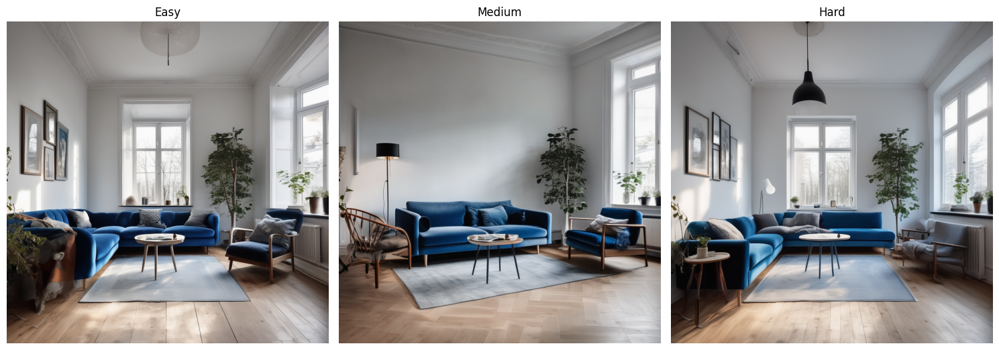

In [11]:
display_images(
    images=[pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(15, 12)
)

## [black-forest-labs/FLUX.1-dev](https://huggingface.co/black-forest-labs/FLUX.1-dev) [Aug 2025]

**Зачем смотрим:** современная модель нового поколения Flux, чтобы оценить, как растёт качество, реализм и соответствие сложным промптам по сравнению со SDXL.

**Pros:**
- Отличное качество визуализации, высокая детализация  
- Хорошо удерживает объекты и детали в промптах  
- Лучшее соответствие стилю, тексту и структуре  

**Cons:**
- Требует больше ресурсов (VRAM, вычислительной мощности)  
- Медленнее, чем SD1.5 и часть SDXL в базовой конфигурации  
- Лицензия Dev может иметь ограничения по коммерческому использованию  

**Specs:**
- `height, width`: 1024 × 1024 (нативное разрешение)  
- `num_inference_steps`: 50 (рекомендуется 30–50)  
- `guidance_scale`: ~5.0–7.5 (по умолчанию ближе к 5.0)  
- `generator`: фиксированный seed для повторяемости  
- Требования: ~14 GB VRAM для 1024×1024 в fp16

In [4]:
model_name = "black-forest-labs/FLUX.1-dev"
device = 'cuda:2'
torch_dtype = torch.bfloat16
seed = 5

params = {
    'height': 1024,
    'width': 1024,
    'num_inference_steps': 50,
    'guidance_scale': 7.5
}

In [5]:
from diffusers import FluxPipeline

torch.cuda.reset_peak_memory_stats(device)
pipe = FluxPipeline.from_pretrained(model_name, torch_dtype=torch_dtype).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Peak after load: 31.44 GB


### Easy Prompt

In [6]:
torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(prompt=easy_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

  0%|          | 0/50 [00:00<?, ?it/s]

Generation time: 45.96s
Peak GPU memory consumption: 33.83Gb


Scandinavian living room with a blue velvet sofa, large windows
letting in sunlight, polished wood floor, white walls, airy
atmosphere.


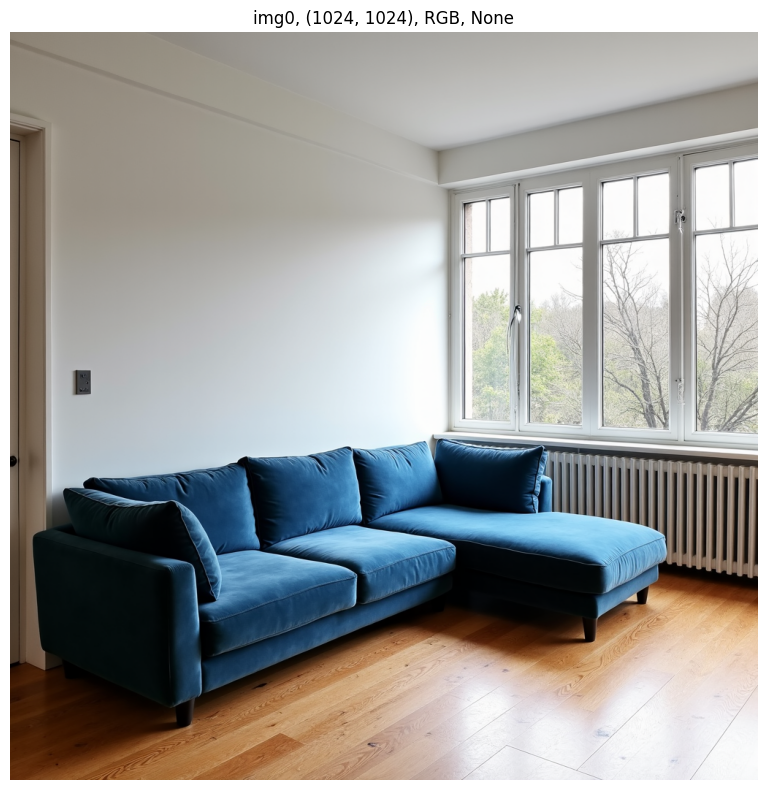

In [7]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Синий диван и стиль заданы чётко  
- ✅ Реалистичный свет и текстуры  
- ✅ Простор комнаты читается хорошо  
- ❌ Немного пустовато, минимум дополнительных деталей   

### Medium Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

Scandinavian living room with a blue velvet sofa against the left
wall, large panoramic windows on the right letting in sunlight, a
modern floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere.


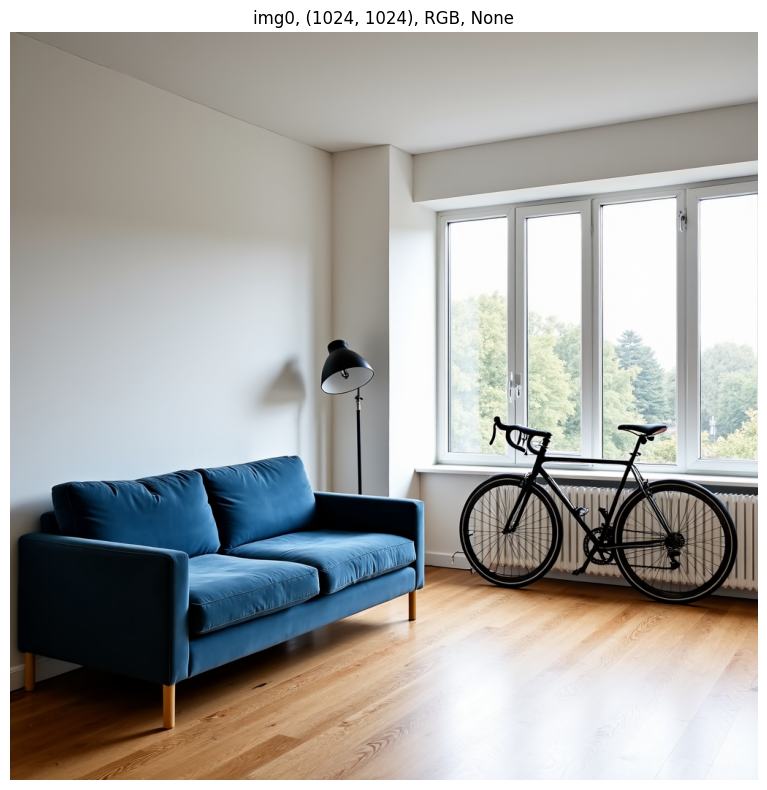

In [8]:
pipe_result_medium = pipe(prompt=medium_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(medium_prompt))
display_images([pipe_result_medium], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Диван, торшер и велосипед на месте — промпт учтён почти полностью  
- ✅ Хорошее качество рендера, геометрия не плывёт  
- ✅ Свет и перспектива выглядят натурально  
- ❌ Интерпретация расположения объектов немного вольно (например, положение велосипеда)   

### Hard Prompt

  0%|          | 0/50 [00:00<?, ?it/s]

20 m² Scandinavian living room with 2.4 m ceiling, blue velvet sofa
against the left wall, large panoramic windows on the right, a modern
floor lamp next to the sofa, and a bicycle leaning against the
windows, polished wood floor and white walls, airy atmosphere,
photorealistic, 24mm lens, f/8, bright midday sunlight.


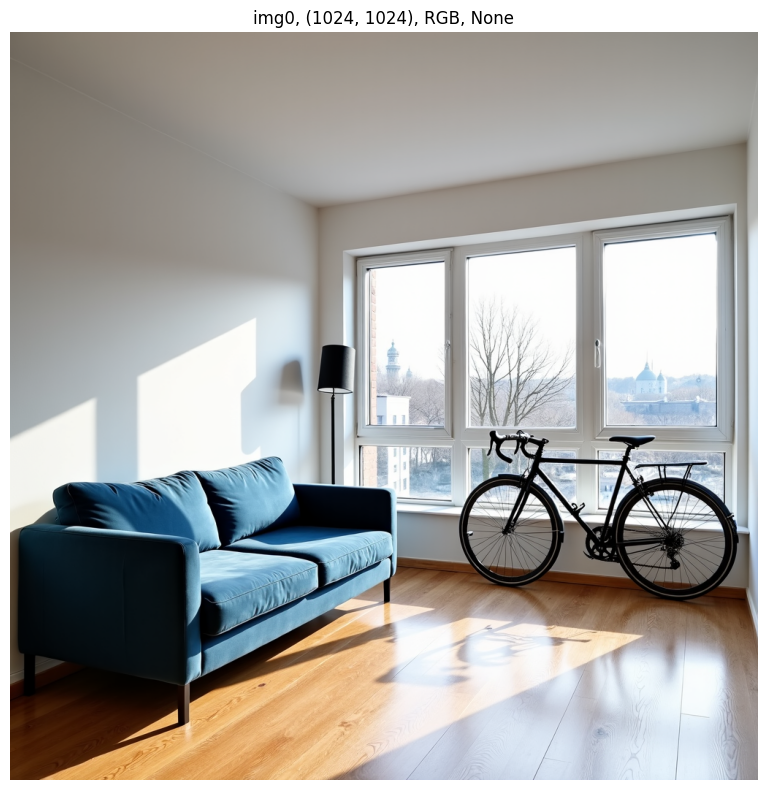

In [9]:
pipe_result_hard = pipe(prompt=hard_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

print(textwrap.fill(hard_prompt))
display_images([pipe_result_hard], figsize=(15, 8), show_axes=False)

**Conclusion:** 
- ✅ Учитываются сложные условия (свет, объектив, фотостиль)  
- ✅ Диван, лампа и велосипед на месте  
- ✅ Отличная детализация и фотореализм  
- ❌ Цифровые параметры (20 м², 2.4 м потолок) проигнорированы  
- ❌ Есть небольшие расхождения с точной компоновкой  

### Comparing

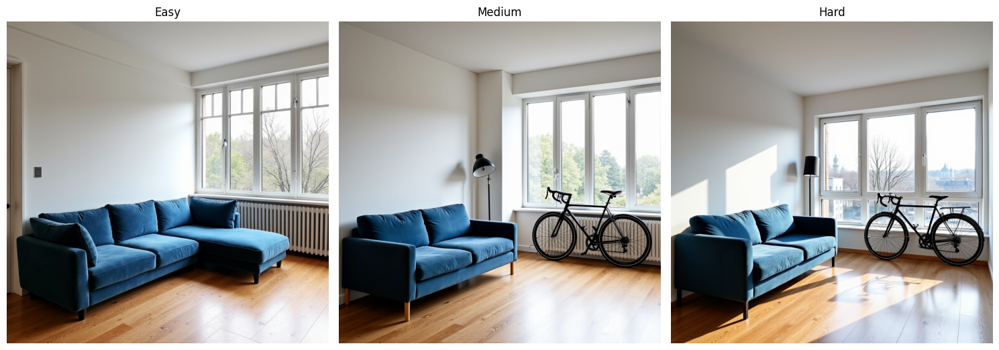

In [10]:
display_images(
    images=[pipe_result_easy, pipe_result_medium, pipe_result_hard],
    titles=['Easy', 'Medium', 'Hard'],
    show_axes=False,
    figsize=(15, 12)
)

## [Qwen/Qwen-Image](https://huggingface.co/DFloat11/Qwen-Image-DF11) [Aug 2025]

**Зачем смотрим:** новая мультимодальная модель семейства Qwen от Alibaba, объединяющая сильное понимание текста и визуализацию. Интересно оценить, насколько лучше она справляется с контекстом и сложными запросами по сравнению с SDXL и Flux.

**Pros:**
- Глубокое понимание длинных и сложных промптов  
- Лучшая семантическая связность (понимает «сценарий», а не только ключевые слова)  
- Реалистичные изображения с сохранением деталей  
- Поддержка разных режимов (txt2img, img2img, inpainting и др.)  

**Cons:**
- Очень требовательна к VRAM и вычислительным ресурсам  
- Медленнее в генерации по сравнению с SDXL  
- Пока в активной разработке, возможны баги и нестабильность  

**Specs:**
- `height, width`: 1024 × 1024 (нативное разрешение)  
- `num_inference_steps`: 30 (рекомендуется 30–40 для скорости/качества)  
- `guidance_scale`: 7.0 (по умолчанию; можно варьировать 6–8)  
- `generator`: фиксированный seed для повторяемости  
- Требования: ≥20 GB VRAM для генерации в fp16  

In [ ]:
model_name = "black-forest-labs/FLUX.1-dev"
device = 'cuda:2'
torch_dtype = torch.bfloat16
seed = 5

params = {
    'height': 1024,
    'width': 1024,
    'num_inference_steps': 50,
    'guidance_scale': 7.5
}

In [ ]:
from diffusers import FluxPipeline

torch.cuda.reset_peak_memory_stats(device)
pipe = FluxPipeline.from_pretrained(model_name, torch_dtype=torch_dtype).to(device)
print(f"Peak after load: {torch.cuda.max_memory_allocated(device)/1024**3:.2f} GB")

In [ ]:
from diffusers import DiffusionPipeline, QwenImageTransformer2DModel
from transformers.modeling_utils import no_init_weights
from dfloat11 import DFloat11Model


# Создаем "пустую" модель без инициализации весов для экономии RAM
with no_init_weights():
    transformer = QwenImageTransformer2DModel.from_config(
        QwenImageTransformer2DModel.load_config("Qwen/Qwen-Image", subfolder="transformer"),
    ).to(torch.bfloat16)

# Загружаем квантованные веса DFloat11 в созданную модель
DFloat11Model.from_pretrained(
    "DFloat11/Qwen-Image-DF11",
    device="cpu", # Веса грузятся на CPU для последующей выгрузки
    cpu_offload=True,
    pin_memory=True,
    bfloat16_model=transformer,
)

pipe = DiffusionPipeline.from_pretrained(
    "Qwen/Qwen-Image",
    transformer=transformer,
    torch_dtype=torch.bfloat16,
).to(device)
pipe.enable_model_cpu_offload()

### Easy Prompt

In [ ]:
torch.cuda.reset_peak_memory_stats(device)
start_time = time.time()

pipe_result_easy = pipe(prompt=easy_prompt, generator=torch.Generator(device).manual_seed(seed), **params).images[0]

torch.cuda.synchronize(device)
end_time = time.time()

gpu_mem = torch.cuda.max_memory_allocated(device) / 1024**3
print(f"Generation time: {end_time - start_time:.2f}s")
print(f"Peak GPU memory consumption: {gpu_mem:.2f}Gb")

In [ ]:
print(textwrap.fill(easy_prompt))
display_images([pipe_result_easy], figsize=(15, 8), show_axes=False)

**Conclusion:**
- ✅ Синий диван и скандинавский стиль воспроизведены чётко  
- ✅ Реалистичное освещение, ровные текстуры  
- ✅ Атмосфера просторной светлой комнаты сохранена  
- ❌ Есть лёгкие «фантазии» в декоре, которых не было в промпте  

### Medium Prompt

### Hard Prompt

### Comparing

- https://huggingface.co/Qwen/Qwen-Image
- https://huggingface.co/DFloat11/Qwen-Image-DF11
- ✅ Максимальное качество (фотореализм, сложные сцены)
- ✅ Понимает длинные и детальные промпты
- ✅ Гибко работает с аспектом, стилями, языками
- ✅ Сильный контроль над композицией и деталями
- ❌ Требует очень мощное “железо” (VRAM 16 ГБ+)
- ❌ Медленнее, чем SDXL
- ❌ Огромный размер модели и ресурсы для запуска

/mnt/ssd/a-lugovoi/anaconda3/envs/py311/lib/python3.11/site-packages/dfloat11/dfloat11.py:18: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources
The config attributes {'pooled_projection_dim': 768} were passed to QwenImageTransformer2DModel, but are not expected and will be ignored. Please verify your config.json configuration file.
Loading DFloat11 safetensors (offloaded to CPU, memory pinned): 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:39<00:00, 39.99s/it]


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Allocated 339738624 bf16 on device cuda:0


Generation time: 402.03 sec
Peak GPU memory: 15.55 GB


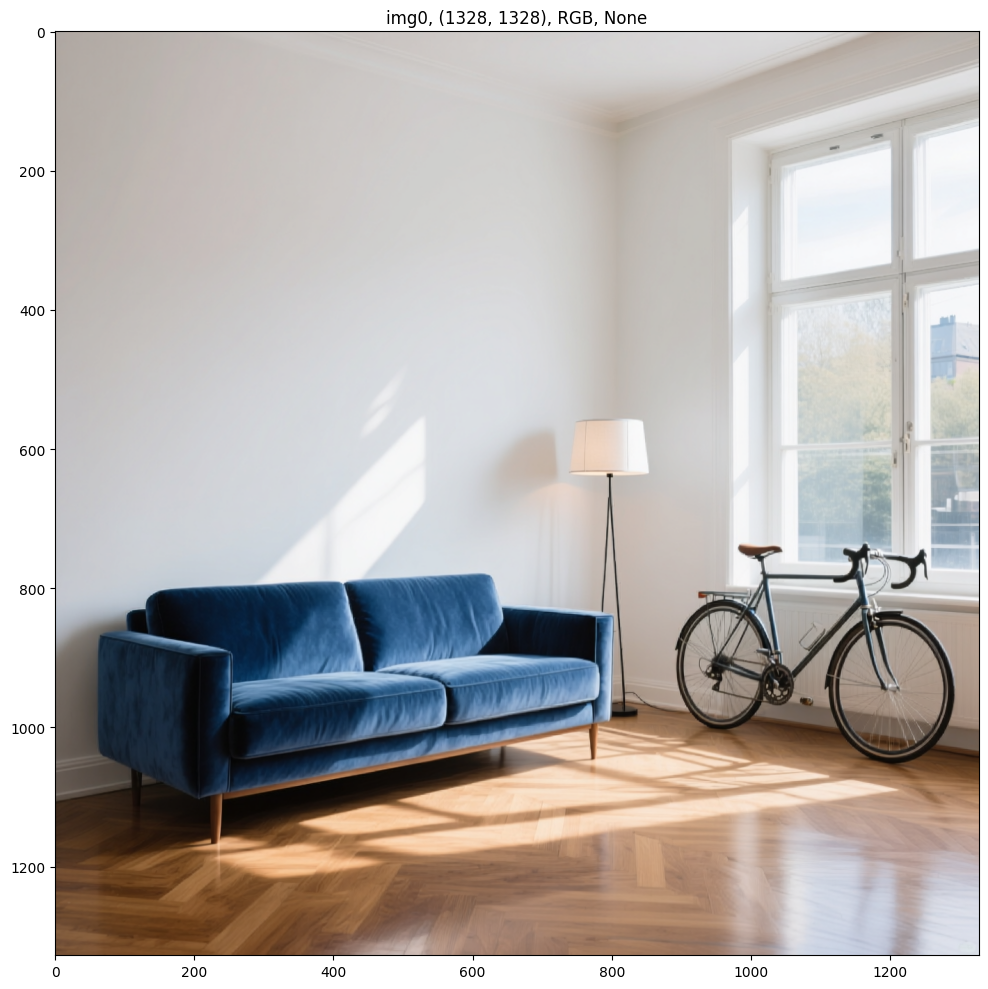

In [2]:
from diffusers import DiffusionPipeline, QwenImageTransformer2DModel
from transformers.modeling_utils import no_init_weights
from dfloat11 import DFloat11Model


device = 'cuda:3'
prompt = (
    "A living room with a blue velvet sofa against the left wall, "
    "large panoramic windows on the right letting in sunlight, "
    "a modern floor lamp next to the sofa, and a bicycle leaning against the windows. "
    "The style is Scandinavian, with polished wood floors and white walls."
)


# Создаем "пустую" модель без инициализации весов для экономии RAM
with no_init_weights():
    transformer = QwenImageTransformer2DModel.from_config(
        QwenImageTransformer2DModel.load_config("Qwen/Qwen-Image", subfolder="transformer"),
    ).to(torch.bfloat16)

# Загружаем квантованные веса DFloat11 в созданную модель
DFloat11Model.from_pretrained(
    "DFloat11/Qwen-Image-DF11",
    device="cpu", # Веса грузятся на CPU для последующей выгрузки
    cpu_offload=True,
    pin_memory=True,
    bfloat16_model=transformer,
)

pipe = DiffusionPipeline.from_pretrained(
    "Qwen/Qwen-Image",
    transformer=transformer,
    torch_dtype=torch.bfloat16,
).to(device)
pipe.enable_model_cpu_offload()

# pipe.enable_sequential_cpu_offload()  # Для весов модели
# pipe.enable_vae_tiling()              # Для тензоров активаций VAE

torch.cuda.empty_cache()
start_time = time.time()

pipe_result = pipe(
    prompt=prompt,
    negative_prompt=" ",
    width=1328,
    height=1328,
    num_inference_steps=50,
    true_cfg_scale=4.0,
    generator=torch.Generator(device=device).manual_seed(42),
)

end_time = time.time()
gpu_mem = torch.cuda.max_memory_allocated() / 1024**3

print(f"Generation time: {end_time - start_time:.2f} sec")
print(f"Peak GPU memory: {gpu_mem:.2f} GB")

display_images(pipe_result.images, figsize=(15, 10))

# Step 2: ControlNet txt2img

## diffusers/controlnet-canny-sdxl-1.0

- https://huggingface.co/docs/diffusers/en/api/pipelines/controlnet_sdxl#diffusers.StableDiffusionXLControlNetPipeline.__call__.example

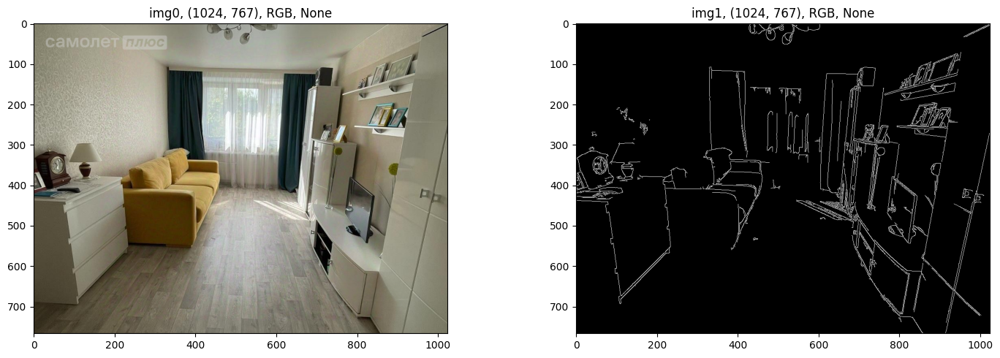

In [11]:
from diffusers import StableDiffusionXLControlNetPipeline, ControlNetModel, AutoencoderKL
from diffusers.utils import load_image
import numpy as np
import torch

import cv2
from PIL import Image

img_canny = np.array(img_pil).copy()
img_canny = cv2.Canny(img_canny, 100, 300)
img_canny = img_canny[:, :, None]
img_canny = np.concatenate([img_canny, img_canny, img_canny], axis=2)
img_canny = Image.fromarray(img_canny)
display_images([img_pil, img_canny])

In [12]:
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0",
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16, cache_dir=CACHE_DIR)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # vae=vae,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# pipe.enable_model_cpu_offload()

config.json:   0%|          | 0.00/1.31k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

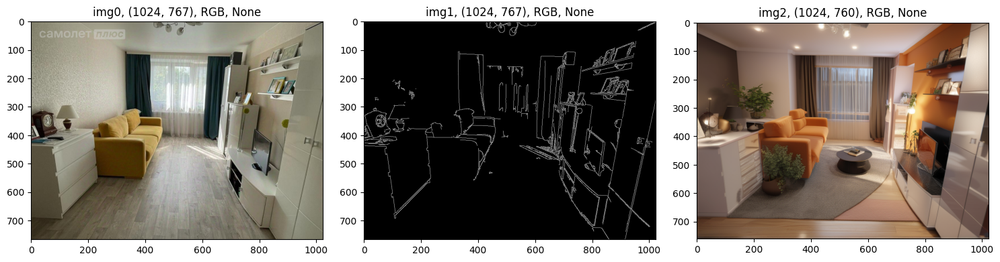

CPU times: user 26.4 s, sys: 3.94 s, total: 30.3 s
Wall time: 29.3 s


In [15]:
%%time

prompt = ["New modern style of livingroom, warm color palette, detailed, 8k"]
negative_prompt = ["low quality, bad quality, sketches"]

img_gen = pipe(
    prompt, 
    negative_prompt=negative_prompt, 
    image=img_canny, 
    controlnet_conditioning_scale=0.6,
    guidance_scale=9,
    eta=0.0,
    generator=torch.Generator(DEVICE).manual_seed(2),
    num_inference_steps=100
)

display_images([img_pil, img_canny] + img_gen.images)

## diffusers/controlnet-depth-sdxl-1.0

- https://huggingface.co/diffusers/controlnet-depth-sdxl-1.0

- for the depth map we will use dpt-beit-large-512 model instead dpt-hybrid-midas (as in the example with diffusers)
- the benchmark of the depth models: https://github.com/isl-org/MiDaS/tree/master

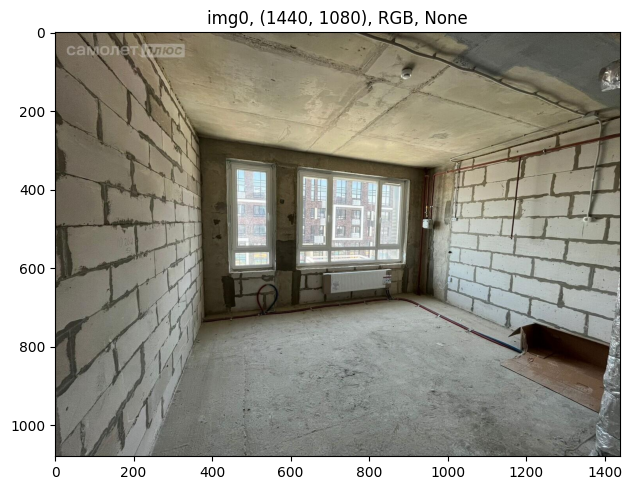

In [4]:
img_pil = Image.open('data/img5003_PrimaryHouse.jpg').convert('RGB')
display_images([img_pil])

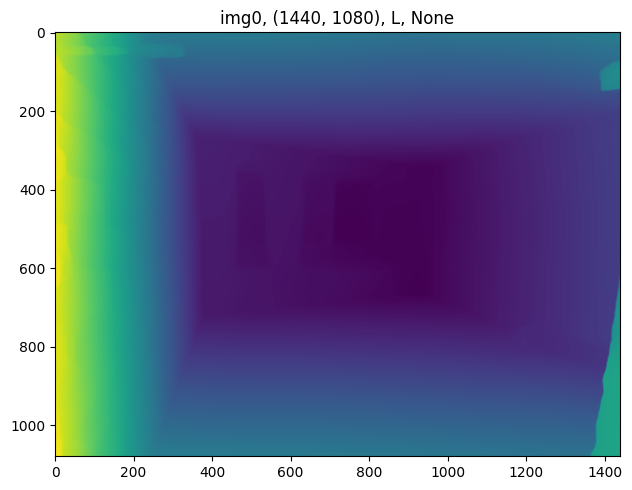

CPU times: user 1min 30s, sys: 29.1 s, total: 1min 59s
Wall time: 3.43 s


In [15]:
%%time

from transformers import DPTImageProcessor, DPTForDepthEstimation
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL


processor = DPTImageProcessor.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)
model = DPTForDepthEstimation.from_pretrained("Intel/dpt-beit-large-512", cache_dir=CACHE_DIR)#.to(DEVICE)

# prepare image for the model
inputs = processor(images=img_pil, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# interpolate to original size
prediction = torch.nn.functional.interpolate(
    predicted_depth.unsqueeze(1),
    size=img_pil.size[::-1],
    mode="bicubic",
    align_corners=False,
)

# visualize the prediction
output = prediction.squeeze().cpu().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")
img_depth = Image.fromarray(formatted)
display_images([img_depth])

In [16]:
%%time

controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)

# vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16).to(DEVICE)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    # vae=vae,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
    cache_dir=CACHE_DIR
).to(DEVICE)
# pipe.enable_model_cpu_offload()

# pipe.load_lora_weights('/home/a.lugovoi/Git/rnd-tasks/generative-ai/models/tuned/MODEL_STYLE1/5000/pytorch_lora_weights.safetensors')
# pipe = pipe.to(DEVICE)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

CPU times: user 2.35 s, sys: 926 ms, total: 3.28 s
Wall time: 3.8 s


  0%|          | 0/100 [00:00<?, ?it/s]

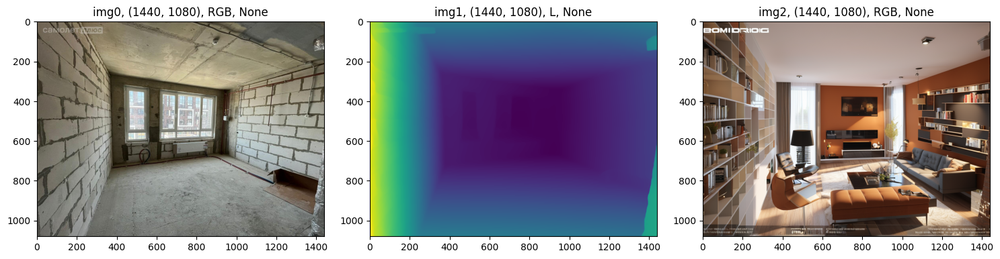

CPU times: user 38.9 s, sys: 11.8 s, total: 50.8 s
Wall time: 49.7 s


In [17]:
%%time

prompt = ["New modern style of livingroom, warm color palette, detailed, 8k"]
negative_prompt = ["low quality, bad quality, sketches"]

img_gen = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=img_depth,
    guidance_scale=13,
    num_images_per_prompt=1,
    num_inference_steps=100, 
    controlnet_conditioning_scale=0.5,
    generator = torch.Generator(DEVICE).manual_seed(8)
)

display_images([img_pil, img_depth] + img_gen.images)

# END